Developed using Google Coloab and Ubuntu 20.04 terminal/OS.

# Connecting to Google Drive

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
path_root = "/content/drive/MyDrive/DSs/glasses_detection_project"

In [4]:
!cd {path_root}/

# Training the model
With a good dataset, it’s time to think about the model.TensorFlow 2 provides an Object Detection API that makes it easy to construct, train, and deploy object detection models. In this project, we’re going to use this API and train the model using a Google Colaboratory Notebook. The remainder of this section explains how to set up the environment, the model selection, and training. If you want to jump straight to the Colab Notebook, click here.

### Setting up the environment
Create a new Google Colab notebook and select a GPU as hardware accelerator:

Runtime > Change runtime type > Hardware accelerator: GPU 
### Clone and install the Tensorflow Object Detection API
In order to use the TensorFlow Object Detection API, we need to clone it's GitHub Repo.

### Dependencies
Most of the dependencies required come preloaded in Google Colab. No extra installation is needed.

## Protocol Buffers
The TensorFlow Object Detection API relies on what are called protocol buffers (also known as protobufs). Protobufs are a language neutral way to describe information. That means you can write a protobuf once and then compile it to be used with other languages, like Python, Java or C [5].

The protoc command used below is compiling all the protocol buffers in the object_detection/protos folder for Python.
### Run once if using google drive or once per session

In [ ]:
!git clone https://github.com/tensorflow/models.git {path_root}/models/

Cloning into '/content/drive/MyDrive/DSs/glasses_detection_project/models'...
remote: Enumerating objects: 74696, done.
remote: Counting objects: 100% (184/184), done.
remote: Compressing objects: 100% (99/99), done.
remote: Total 74696 (delta 97), reused 157 (delta 82), pack-reused 74512
Receiving objects: 100% (74696/74696), 580.36 MiB | 15.75 MiB/s, done.
Resolving deltas: 100% (52967/52967), done.
Checking out files: 100% (3080/3080), done.


### Installing protobufs

In [11]:
%cd {path_root}/models/research/
!protoc object_detection/protos/*.proto --python_out=.
# Install TensorFlow Object Detection API.
!cp object_detection/packages/tf2/setup.py .
!python -m pip install .

/content/drive/.shortcut-targets-by-id/1ICDl8YeYQgBB5FK2XWH-e75qELCDjzqZ/DSs/glasses_detection_project/models/research
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Processing /content/drive/.shortcut-targets-by-id/1ICDl8YeYQgBB5FK2XWH-e75qELCDjzqZ/DSs/glasses_detection_project/models/research
  DEPRECATION: A future pip version will change local packages to be built in-place without first copying to a temporary directory. We recommend you use --use-feature=in-tree-build to test your packages with this new behavior before it becomes the default.
   pip 21.3 will remove support for this functionality. You can find discussion regarding this at https://github.com/pypa/pip/issues/7555.
     |████████████████████████████████| 10.9 MB 11.3 MB/s 
     |████████████████████████████████| 352 kB 77.0 MB/s 
     |████████████████████████████████| 2.1 MB 42.0 MB/s 
     |████████████████████████████████| 25.9 MB 1.3 MB/s 
     |█████████████████

### Run the model builder test - Optional to run

In [5]:
!python {path_root}/models/research/object_detection/builders/model_builder_tf2_test.py

Running tests under Python 3.7.13: /usr/bin/python3
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_deepmac
2022-06-28 08:21:07.852227: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:42] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
W0628 08:21:08.099057 140347812091776 model_builder.py:1102] Building experimental DeepMAC meta-arch. Some features may be omitted.
INFO:tensorflow:time(__main__.ModelBuilderTF2Test.test_create_center_net_deepmac): 1.5s
I0628 08:21:08.461358 140347812091776 test_util.py:2459] time(__main__.ModelBuilderTF2Test.test_create_center_net_deepmac): 1.5s
[       OK ] ModelBuilderTF2Test.test_create_center_net_deepmac
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_model0 (customize_head_params=True)
INFO:tensorflow:time(__main__.ModelBuilderTF2Test.test_create_center_net_model0 (customize_head_params=True)): 0.53s
I0628 08:21:08.991438 140347812091776 test_uti

## Getting and processing the data
As mentioned before, the model is going to be trained using the Our own custom  created dataset.
### Run once if using google drive or once per session

In [ ]:
!mkdir {path_root}/dataset

### Extracting.zip images and annotations.zip

In [ ]:
!unzip {path_root}"/dataset/images" -d {path_root}"/dataset"

Archive:  /content/drive/MyDrive/DSs/glasses_detection_project/MeGlass_Sorted_1024x1024_330_images.zip
   creating: /content/drive/MyDrive/DSs/glasses_detection_project/dataset/MeGlass_Sorted_1024x1024_330_images/
  inflating: /content/drive/MyDrive/DSs/glasses_detection_project/dataset/MeGlass_Sorted_1024x1024_330_images/face (1).png  
  inflating: /content/drive/MyDrive/DSs/glasses_detection_project/dataset/MeGlass_Sorted_1024x1024_330_images/face (10).png  
  inflating: /content/drive/MyDrive/DSs/glasses_detection_project/dataset/MeGlass_Sorted_1024x1024_330_images/face (100).png  
  inflating: /content/drive/MyDrive/DSs/glasses_detection_project/dataset/MeGlass_Sorted_1024x1024_330_images/face (101).png  
  inflating: /content/drive/MyDrive/DSs/glasses_detection_project/dataset/MeGlass_Sorted_1024x1024_330_images/face (102).png  
  inflating: /content/drive/MyDrive/DSs/glasses_detection_project/dataset/MeGlass_Sorted_1024x1024_330_images/face (103).png  
  inflating: /content/drive

In [ ]:
!unzip {path_root}"/dataset/annotations" -d {path_root}"/dataset"

Archive:  /content/drive/MyDrive/DSs/glasses_detection_project/MeGlass_Sorted_1024x1024_330_annotations.zip
   creating: /content/drive/MyDrive/DSs/glasses_detection_project/dataset/MeGlass_Sorted_1024x1024_330_annotations/
  inflating: /content/drive/MyDrive/DSs/glasses_detection_project/dataset/MeGlass_Sorted_1024x1024_330_annotations/face (1).xml  
  inflating: /content/drive/MyDrive/DSs/glasses_detection_project/dataset/MeGlass_Sorted_1024x1024_330_annotations/face (10).xml  
  inflating: /content/drive/MyDrive/DSs/glasses_detection_project/dataset/MeGlass_Sorted_1024x1024_330_annotations/face (100).xml  
  inflating: /content/drive/MyDrive/DSs/glasses_detection_project/dataset/MeGlass_Sorted_1024x1024_330_annotations/face (101).xml  
  inflating: /content/drive/MyDrive/DSs/glasses_detection_project/dataset/MeGlass_Sorted_1024x1024_330_annotations/face (102).xml  
  inflating: /content/drive/MyDrive/DSs/glasses_detection_project/dataset/MeGlass_Sorted_1024x1024_330_annotations/face

### Now, it’s necessary to create a labelmap file to define the classes that are going to be used. "glasses" is the only one, so right-click in the File section in dataset folder on Google Colab and create a New file named labelmap.pbtxt as follows:

```
item {
    name: "glasses"
    id: 1
}
```

The last step is to convert the data into a sequence of binary records so that they can be fed into Tensorflow’s object detection API. To do so, transform the data into the TFRecord format using the generate_tf_records.py script available in the Dataset:

### Creating CSVs of XML labels:
#### Reference: https://gist.github.com/iKhushPatel/ed1f837656b155d9b94d45b42e00f5e4 - Cusomized as per our need
#### Run once if using google drive or once per session

In [ ]:
import os
import glob
import pandas as pd
import xml.etree.ElementTree as ET

def xml_to_csv(path):
    xml_list = []
    for xml_file in glob.glob(path + '/*.xml'):
        tree = ET.parse(xml_file)
        root = tree.getroot()
        for member in root.findall('object'):
            value = (root.find('filename').text,
                     int(root.find('size')[0].text),
                     int(root.find('size')[1].text),
                     member[0].text,
                     int(member[4][0].text),
                     int(member[4][1].text),
                     int(member[4][2].text),
                     int(member[4][3].text)
                     )
            xml_list.append(value)
    column_name = ['filename', 'width', 'height', 'class', 'xmin', 'ymin', 'xmax', 'ymax']
    xml_df = pd.DataFrame(xml_list, columns=column_name)
    return xml_df
  
xml_path = path_root + '/dataset/annotations'
df = xml_to_csv(xml_path)
df.head(3)

,filename,width,height,class,xmin,ymin,xmax,ymax
0,face (1).png,1024,1024,glasses,196,437,810,578
1,face (10).png,1024,1024,glasses,225,444,788,552
2,face (100).png,1024,1024,glasses,215,432,837,601


In [ ]:
df.shape

(330, 8)

### Assigning out of 136 images we divide 5% for test and 95% for train 

In [ ]:
df_test = df.sample(frac = 0.10) # Assigning 33 out of 330 that is 10% images we divide 5% for test and 95% for train 
df_train = df[~df['filename'].isin(df_test['filename'])]

In [ ]:
df_test.head(3)

,filename,width,height,class,xmin,ymin,xmax,ymax
76,face (168).png,1024,1024,glasses,228,427,837,597
289,face (62).png,1024,1024,glasses,129,429,801,587
320,face (90).png,1024,1024,glasses,118,398,786,566


In [ ]:
df_test.shape

(33, 8)

In [ ]:
df_train.shape

(297, 8)

In [ ]:
# Writing dataframe to csv
df_train.to_csv(path_root + '/dataset/train_labels.csv')

In [ ]:
# Writing dataframe to csv
df_test.to_csv(path_root + '/dataset/test_labels.csv')

### Creating record files of label CSVs:
#### Reference: https://gist.github.com/iKhushPatel/5614a36f26cf6459cc49c8248e8b5b48 - Cusomized as per our need - 

### Run once if using google drive or once per session

In [ ]:
"""
Usage:
  # From tensorflow/models/
  # Create train data:
  python generate_tfrecord.py --csv_input=dataset/train_labels.csv  --output_path=dataset/train.record
  # Create test data:
  python generate_tfrecord.py --csv_input=dataset/test_labels.csv  --output_path=dataset/test.record
"""

from __future__ import division
from __future__ import print_function
from __future__ import absolute_import

import os
import io
import pandas as pd
#import tensorflow as tf
import tensorflow.compat.v1 as tf
from PIL import Image
import sys
sys.path.append('../')
from object_detection.utils import dataset_util
from collections import namedtuple, OrderedDict


csv_input = path_root + '/dataset/train_labels.csv'
output_path = path_root + '/dataset/train.record'
image_dir = path_root + '/dataset/images/'


# TO-DO replace this with label map
def class_text_to_int(row_label):
    if row_label == 'Label1':
        return 1
    if row_label == 'Label2':
        return 2
    else:
        return 0


def split(df, group):
    data = namedtuple('data', ['filename', 'object'])
    gb = df.groupby(group)
    return [data(filename, gb.get_group(x)) for filename, x in zip(gb.groups.keys(), gb.groups)]


def create_tf_example(group, path):
    with tf.gfile.GFile(os.path.join(path, '{}'.format(group.filename)), 'rb') as fid:
        encoded_jpg = fid.read()
    encoded_jpg_io = io.BytesIO(encoded_jpg)
    image = Image.open(encoded_jpg_io)
    width, height = image.size

    filename = group.filename.encode('utf8')
    image_format = b'jpg'
    xmins = []
    xmaxs = []
    ymins = []
    ymaxs = []
    classes_text = []
    classes = []

    for index, row in group.object.iterrows():
        xmins.append(row['xmin'] / width)
        xmaxs.append(row['xmax'] / width)
        ymins.append(row['ymin'] / height)
        ymaxs.append(row['ymax'] / height)
        classes_text.append(row['class'].encode('utf8'))
        classes.append(class_text_to_int(row['class']))

    tf_example = tf.train.Example(features=tf.train.Features(feature={
        'image/height': dataset_util.int64_feature(height),
        'image/width': dataset_util.int64_feature(width),
        'image/filename': dataset_util.bytes_feature(filename),
        'image/source_id': dataset_util.bytes_feature(filename),
        'image/encoded': dataset_util.bytes_feature(encoded_jpg),
        'image/format': dataset_util.bytes_feature(image_format),
        'image/object/bbox/xmin': dataset_util.float_list_feature(xmins),
        'image/object/bbox/xmax': dataset_util.float_list_feature(xmaxs),
        'image/object/bbox/ymin': dataset_util.float_list_feature(ymins),
        'image/object/bbox/ymax': dataset_util.float_list_feature(ymaxs),
        'image/object/class/text': dataset_util.bytes_list_feature(classes_text),
        'image/object/class/label': dataset_util.int64_list_feature(classes),
    }))
    return tf_example

# For train

writer = tf.python_io.TFRecordWriter(output_path)
path = os.path.join(image_dir)
examples = pd.read_csv(csv_input)
grouped = split(examples, 'filename')
for group in grouped:
    tf_example = create_tf_example(group, path)
    writer.write(tf_example.SerializeToString())

writer.close()
output_path = os.path.join(os.getcwd(), output_path)
print('Successfully created the TFRecords: {}'.format(output_path))

Successfully created the TFRecords: /content/drive/MyDrive/DSs/glasses_detection_project/dataset/train.record


In [ ]:
# For test

csv_input = path_root + '/dataset/test_labels.csv'
output_path = path_root + '/dataset/test.record'

writer = tf.python_io.TFRecordWriter(output_path)
path = os.path.join(image_dir)
examples = pd.read_csv(csv_input)
grouped = split(examples, 'filename')
for group in grouped:
    tf_example = create_tf_example(group, path)
    writer.write(tf_example.SerializeToString())

writer.close()
output_path = os.path.join(os.getcwd(), output_path)
print('Successfully created the TFRecords: {}'.format(output_path))

Successfully created the TFRecords: /content/drive/MyDrive/DSs/glasses_detection_project/dataset/test.record


## Choosing the model
We’re ready to choose the model that’s going to be the Glasses Detector. TensorFlow 2 provides 40 pre-trained detection models on the COCO 2017 Dataset. This collection is the TensorFlow 2 Detection Model Zoo and can be accessed here.

Every model has a Speed, Mean Average Precision(mAP) and Output. Generally, a higher mAP implies a lower speed, but as this project is based on a one-class object detection problem, the faster model (SSD MobileNet v2 320x320) should be enough.

Besides the Model Zoo, TensorFlow provides a Models Configs Repository as well. There, it’s possible to get the configuration file that has to be modified before the training. Let’s download the files:

In [ ]:
%cd {path_root}/

/content/drive/.shortcut-targets-by-id/1ICDl8YeYQgBB5FK2XWH-e75qELCDjzqZ/DSs/glasses_detection_project


## Run once if using google drive or once per session

In [ ]:
!wget http://download.tensorflow.org/models/object_detection/classification/tf2/20200710/mobilenet_v2.tar.gz
!tar -xvf mobilenet_v2.tar.gz
!rm mobilenet_v2.tar.gz

--2022-06-27 11:02:30--  http://download.tensorflow.org/models/object_detection/classification/tf2/20200710/mobilenet_v2.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 142.250.188.48, 2607:f8b0:4004:800::2010
Connecting to download.tensorflow.org (download.tensorflow.org)|142.250.188.48|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8404070 (8.0M) [application/x-tar]
Saving to: ‘mobilenet_v2.tar.gz’

mobilenet_v2.tar.gz 100%[===================>]   8.01M  48.4MB/s    in 0.2s    

2022-06-27 11:02:31 (48.4 MB/s) - ‘mobilenet_v2.tar.gz’ saved [8404070/8404070]

mobilenet_v2/
mobilenet_v2/mobilenet_v2.ckpt-1.index
mobilenet_v2/checkpoint
mobilenet_v2/mobilenet_v2.ckpt-1.data-00001-of-00002
mobilenet_v2/mobilenet_v2.ckpt-1.data-00000-of-00002


In [ ]:
!wget https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_mobilenet_v2_320x320_coco17_tpu-8.config
!mv ssd_mobilenet_v2_320x320_coco17_tpu-8.config mobilenet_v2.config

--2022-06-27 11:02:35--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_mobilenet_v2_320x320_coco17_tpu-8.config
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4484 (4.4K) [text/plain]
Saving to: ‘ssd_mobilenet_v2_320x320_coco17_tpu-8.config’

ssd_mobilenet_v2_32 100%[===================>]   4.38K  --.-KB/s    in 0.001s  

2022-06-27 11:02:35 (4.96 MB/s) - ‘ssd_mobilenet_v2_320x320_coco17_tpu-8.config’ saved [4484/4484]



## Configure training - Run once per session
As mentioned before, the downloaded weights were pre-trained on the COCO 2017 Dataset, but the focus here is to train the model to recognize one class so these weights are going to be used only to initialize the network — this technique is known as transfer learning, and it’s commonly used to speed up the learning process.

From now, what has to be done is to set up the mobilenet_v2.config file, and start the training. I highly recommend reading the MobileNetV2 paper (Sandler, Mark, et al. - 2018) to get the gist of the architecture.

Choosing the best hyperparameters is a task that requires some experimentation. As the resources are limited in the Google Colab, I am going to use the same batch size as the paper, set a number of steps to get a reasonably low loss, and leave all the other values as default. If you want to try something more sophisticated to find the hyperparameters, I recommend Keras Tuner - an easy-to-use framework that applies Bayesian Optimization, Hyperband, and Random Search algorithms.



#### Defining training parameters

In [12]:
num_classes = 1
batch_size = 60
num_steps = 15000
num_eval_steps = 1000

train_record_path = path_root+'/dataset/train.record'
test_record_path = path_root+'/dataset/test.record'
model_dir = path_root+'/training/'
labelmap_path = path_root+'/dataset/labelmap.pbtxt'

pipeline_config_path = path_root+'/mobilenet_v2.config'
fine_tune_checkpoint = path_root+'/mobilenet_v2/mobilenet_v2.ckpt-1'

#### Editing config file

In [13]:
import re

with open(pipeline_config_path) as f:
    config = f.read()

with open(pipeline_config_path, 'w') as f:

  # Set labelmap path
  config = re.sub('label_map_path: ".*?"', 
             'label_map_path: "{}"'.format(labelmap_path), config)
  
  # Set fine_tune_checkpoint path
  config = re.sub('fine_tune_checkpoint: ".*?"',
                  'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), config)
  
  # Set train tf-record file path
  config = re.sub('(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")', 
                  'input_path: "{}"'.format(train_record_path), config)
  
  # Set test tf-record file path
  config = re.sub('(input_path: ".*?)(PATH_TO_BE_CONFIGURED/val)(.*?")', 
                  'input_path: "{}"'.format(test_record_path), config)
  
  # Set number of classes.
  config = re.sub('num_classes: [0-9]+',
                  'num_classes: {}'.format(num_classes), config)
  
  # Set batch size
  config = re.sub('batch_size: [0-9]+',
                  'batch_size: {}'.format(batch_size), config)
  
  # Set training steps
  config = re.sub('num_steps: [0-9]+',
                  'num_steps: {}'.format(num_steps), config)
  
  f.write(config)

### Error Solving:
"ImportError: cannot import name '_registerMatType' from 'cv2.cv2' (/usr/local/lib/python3.7/dist-packages/cv2/cv2.cpython-37m-x86_64-linux-gnu.so)"

In [14]:
!pip uninstall opencv-python-headless==4.5.5.62

Found existing installation: opencv-python-headless 4.5.2.52
Uninstalling opencv-python-headless-4.5.2.52:
  Would remove:
    /usr/local/lib/python3.7/dist-packages/cv2/*
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless-4.5.2.52.dist-info/*
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libavcodec-8daa01ff.so.58.109.100
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libavformat-06a336f2.so.58.61.100
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libavutil-01d48d95.so.56.60.100
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libbz2-a273e504.so.1.0.6
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libcrypto-098682aa.so.1.1
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libpng15-c2ffaf3d.so.15.13.0
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libssl-f3db6a3b.so.1.1
    /usr/local/lib/python3.7/dist-package

In [15]:
!pip install opencv-python-headless==4.5.2.52

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached opencv_python_headless-4.5.2.52-cp37-cp37m-manylinux2014_x86_64.whl (38.2 MB)


### Error solving: 
"Node: 'ssd_mobile_net_v2_keras_feature_extractor/model/Conv1/Conv2D'
DNN library is not found." 

In [16]:
!pip install tensorflow==2.7.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     | 665.5 MB 101.3 MB/s
  Using cached tensorflow_estimator-2.7.0-py2.py3-none-any.whl (463 kB)
  Using cached keras-2.7.0-py2.py3-none-any.whl (1.3 MB)
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.9.0
    Uninstalling tensorflow-estimator-2.9.0:
      Successfully uninstalled tensorflow-estimator-2.9.0
  Attempting uninstall: keras
    Found existing installation: keras 2.9.0
    Uninstalling keras-2.9.0:
      Successfully uninstalled keras-2.9.0
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.9.1
    Uninstalling tensorflow-2.9.1:
      Successfully uninstalled tensorflow-2.9.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tf-models-official 2.9.2 requires tensorflow~=

### Caution: Below code block Removes the training folder and all its contents - Removing the train folder - Optional if you want to retrain.

In [ ]:
#!rm -r {path_root}/training

## With the parameters set, start the training:

In [17]:
!cd {path_root}
!python {path_root}/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_config_path} \
    --model_dir={model_dir} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --sample_1_of_n_eval_examples=1 \
    --num_eval_steps={num_eval_steps}

2022-06-28 12:58:28.018720: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
I0628 12:58:28.036121 140087626643328 mirrored_strategy.py:376] Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
INFO:tensorflow:Maybe overwriting train_steps: 15000
I0628 12:58:28.044157 140087626643328 config_util.py:552] Maybe overwriting train_steps: 15000
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I0628 12:58:28.044348 140087626643328 config_util.py:552] Maybe overwriting use_bfloat16: False
Instructions for updating:
rename to distribute_datasets_from_function
W0628 12:58:28.406404 140087626643328 deprecation.py:347] From /usr/local/lib/python3.7/dist-packages/object_detection/model_lib_v2.py:564: StrategyBase.experime

To identify how well the training is going, we use the loss value. Loss is a number indicating how bad the model’s prediction was on the training samples. If the model’s prediction is perfect, the loss is zero; otherwise, the loss is greater. The goal of training a model is to find a set of weights and biases that have low loss, on average, across all examples (Descending into ML: Training and Loss | Machine Learning Crash Course).

From the logs, it’s possible to see a downward trend in the values so we say that “The model is converging”. In the next section, we’re going to plot these values for all training steps and the trend will be even clearer.

The model took around 4h to train (with Colab GPU), but by setting different parameters, you can make the process faster or slower. Everything depends on the number of classes you are using and your Precision/Recall target. A highly accurate network that recognizes multiple classes will take more steps and require more detailed parameters tuning.

# Validate the model
Now let’s evaluate the trained model using the test data:

#### Here we're going to run the code through a loop that waits for checkpoints to evaluate. Once the evaluation finishes, you're going to see the message:

INFO:tensorflow:Waiting for new checkpoint at /< your_project_folder >/training/

Then you can stop the cell

In [18]:
!python {path_root}/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_config_path} \
    --model_dir={model_dir} \
    --checkpoint_dir={model_dir}

W0628 13:51:26.253338 140318393227136 model_lib_v2.py:1090] Forced number of epochs for all eval validations to be 1.
INFO:tensorflow:Maybe overwriting sample_1_of_n_eval_examples: None
I0628 13:51:26.253615 140318393227136 config_util.py:552] Maybe overwriting sample_1_of_n_eval_examples: None
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I0628 13:51:26.253706 140318393227136 config_util.py:552] Maybe overwriting use_bfloat16: False
INFO:tensorflow:Maybe overwriting eval_num_epochs: 1
I0628 13:51:26.253788 140318393227136 config_util.py:552] Maybe overwriting eval_num_epochs: 1
W0628 13:51:26.253911 140318393227136 model_lib_v2.py:1110] Expected number of evaluation epochs is 1, but instead encountered `eval_on_train_input_config.num_epochs` = 0. Overwriting `num_epochs` to 1.
2022-06-28 13:51:29.565875: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original confi

#### The evaluation was done in 7 images and provides three metrics based on the COCO detection evaluation metrics: Precision, Recall and Loss.

The Recall measures how good the model is at hitting the positive class, That is, from the positive samples, how many did the algorithm get right?


Recall

Precision defines how much you can rely on the positive class prediction: From the samples that the model said were positive, how many actually are?


Precision

Setting a practical example: Imagine we have an image containing 10 Glasses, our model returned 5 detections, being 3 real Glasses (TP = 3, FN =7) and 2 wrong detections (FP = 2). In that case, we have a 30% recall (the model detected 3 out of 10 Glasses in the image) and a 60% precision (from the 5 detections, 3 were correct).

The precision and recall were divided by Intersection over Union (IoU) thresholds. The IoU is defined as the area of the intersection divided by the area of the union of a predicted bounding box (B) to a ground-truth box (B)(Zeng, N. - 2018):


Intersection over Union

For simplicity, it’s possible to consider that the IoU thresholds are used to determine whether a detection is a true positive(TP), a false positive(FP) or a false negative (FN). See an example below:


IoU threshold examples

With these concepts in mind, we can analyze some of the metrics we got from the evaluation. From the TensorFlow 2 Detection Model Zoo, the SSD MobileNet v2 320x320 has an mAP of 0.202. Our model presented the following average precisions (AP) for different IoUs:

 
AP@[IoU=0.50:0.95 | area=all | maxDets=100] = 0.222
AP@[IoU=0.50      | area=all | maxDets=100] = 0.405
AP@[IoU=0.75      | area=all | maxDets=100] = 0.221
That’s pretty good! And we can compare the obtained APs with the SSD MobileNet v2 320x320 mAP as from the COCO Dataset documentation:

We make no distinction between AP and mAP (and likewise AR and mAR) and assume the difference is clear from context.

The Average Recall(AR) was split by the max number of detection per image (1, 10, 100). When we have just one Glasses per image, the recall is around 30% while when we have up to 100 Glasses it is around 51%. These values are not that good but are reasonable for the kind of problem we’re trying to solve.

 
(AR)@[ IoU=0.50:0.95 | area=all | maxDets=  1] = 0.293
(AR)@[ IoU=0.50:0.95 | area=all | maxDets= 10] = 0.414
(AR)@[ IoU=0.50:0.95 | area=all | maxDets=100] = 0.514
The Loss analysis is very straightforward, we’ve got 4 values:

 
INFO:tensorflow: + Loss/localization_loss: 0.345804
INFO:tensorflow: + Loss/classification_loss: 1.496982
INFO:tensorflow: + Loss/regularization_loss: 0.130125
INFO:tensorflow: + Loss/total_loss: 1.972911
The localization loss computes the difference between the predicted bounding boxes and the labeled ones. The classification loss indicates whether the bounding box class matches with the predicted class. The regularization loss is generated by the network’s regularization function and helps to drive the optimization algorithm in the right direction. The last term is the total loss and is the sum of three previous ones.

Tensorflow provides a tool to visualize all these metrics in an easy way. It’s called TensorBoard and can be initialized by the following command:

In [19]:
%load_ext tensorboard 
%tensorboard --logdir {path_root}'/training/' 
#%reload_ext tensorboard #reload it after started

<IPython.core.display.Javascript object>

#### This is going to be shown, and you can explore all training and evaluation metrics.


Tensorboard — Loss

In the tab IMAGES, it’s possible to find some comparisons between the predictions and the ground truth side by side. A very interesting resource to explore during the validation process as well.


Tensorboard — Testing images

# Exporting the model
Now that the training is validated, it’s time to export the model. We’re going to convert the training checkpoints to a protobuf (pb) file. This file is going to have the graph definition and the weights of the model.

## Caution: deletes inference_graph exported model folder - Run it if you want to export the model again.

In [21]:
#!rm -r {path_root}/inference_graph

## Export the Inference Graph
The below code cell adds a line to the tf_utils.py file. This is a temporary fix to a exporting issue occuring when using the API with Tensorflow 2. This code will be removed as soon as the TF Team puts out a fix.

All credit goes to the Github users Jacobsolawetz and Tanner Gilbert, who provided this temporary fix.

In [ ]:
!wget -P {path_root}/ https://github.com/bighuang624/Andrew-Ng-Deep-Learning-notes/blob/master/assignments/assignment2-3/tf_utils.py

--2022-06-28 05:24:42--  https://github.com/bighuang624/Andrew-Ng-Deep-Learning-notes/blob/master/assignments/assignment2-3/tf_utils.py
Resolving github.com (github.com)... 140.82.114.3
Connecting to github.com (github.com)|140.82.114.3|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/html]
Saving to: ‘/content/drive/MyDrive/DSs/glasses_detection_project/tf_utils.py’

tf_utils.py             [ <=>                ] 194.86K  --.-KB/s    in 0.05s   

2022-06-28 05:24:42 (4.00 MB/s) - ‘/content/drive/MyDrive/DSs/glasses_detection_project/tf_utils.py’ saved [199538]



In [20]:
with open(path_root+'/tf_utils.py') as f:
    tf_utils = f.read()

with open(path_root+'/tf_utils.py', 'w') as f:
  # Set labelmap path
  throw_statement = "raise TypeError('Expected Operation, Variable, or Tensor, got ' + str(x))"
  tf_utils = tf_utils.replace(throw_statement, "if not isinstance(x, str):" + throw_statement)
  f.write(tf_utils)

In [22]:
output_directory = path_root+'/inference_graph'

!python {path_root}/models/research/object_detection/exporter_main_v2.py \
    --trained_checkpoint_dir {model_dir} \
    --output_directory {output_directory} \
    --pipeline_config_path {pipeline_config_path} 

2022-06-28 13:52:30.323223: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.map_fn(fn, elems, back_prop=False)
Use:
results = tf.nest.map_structure(tf.stop_gradient, tf.map_fn(fn, elems))
W0628 13:52:30.486592 139704343304064 deprecation.py:619] From /usr/local/lib/python3.7/dist-packages/tensorflow/python/autograph/impl/api.py:464: calling map_fn_v2 (from tensorflow.python.ops.map_fn) with back_prop=False is deprecated and will be removed in a future version.
Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.map_fn(fn, elems, back_prop=False)
Use:
results = tf.nest.map_structure(tf.stop_gradient, tf.map_fn(fn, elems))
INFO:tensorflow:depth of addition

As we’re going to deploy the model using TensorFlow.js and Google Colab has a maximum lifetime limit of 12 hours, let’s download the trained weights and save them locally. When running the command files.download('/< your_project_folder >/saved_model.zip"), the colab will prompt the file automatically.

## Compressing the tensorflow saved model to download - Run once if you are using Google drive else once per session.

In [23]:
!zip -r {path_root}/inference_graph/saved_model.zip {path_root}/inference_graph/saved_model

  adding: content/drive/MyDrive/DSs/glasses_detection_project/inference_graph/saved_model/ (stored 0%)
  adding: content/drive/MyDrive/DSs/glasses_detection_project/inference_graph/saved_model/variables/ (stored 0%)
  adding: content/drive/MyDrive/DSs/glasses_detection_project/inference_graph/saved_model/variables/variables.data-00000-of-00001 (deflated 7%)
  adding: content/drive/MyDrive/DSs/glasses_detection_project/inference_graph/saved_model/variables/variables.index (deflated 77%)
  adding: content/drive/MyDrive/DSs/glasses_detection_project/inference_graph/saved_model/assets/ (stored 0%)
  adding: content/drive/MyDrive/DSs/glasses_detection_project/inference_graph/saved_model/saved_model.pb (deflated 92%)


## Downloading the saved zipped model

In [24]:
from google.colab import files
files.download(path_root+"/inference_graph/saved_model.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### If you want to check if the model was saved properly, load, and test it. I’ve created some functions to make this process easier so feel free to clone the inferenceutils.py file from my GitHub to test some images.

# Testing the trained model
Based on Object Detection API Demo and Inference from saved model tf2 colab.

## Run only once if you are using google drive or once per session

In [ ]:
!wget -P {path_root}/ https://raw.githubusercontent.com/hugozanini/object-detection/master/inferenceutils.py

--2022-06-28 05:17:18--  https://raw.githubusercontent.com/hugozanini/object-detection/master/inferenceutils.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2219 (2.2K) [text/plain]
Saving to: ‘/content/drive/MyDrive/DSs/glasses_detection_project/inferenceutils.py’

inferenceutils.py   100%[===================>]   2.17K  --.-KB/s    in 0.001s  

2022-06-28 05:17:18 (3.15 MB/s) - ‘/content/drive/MyDrive/DSs/glasses_detection_project/inferenceutils.py’ saved [2219/2219]



# Loading the model

In [25]:
from inferenceutils import *
output_directory = path_root+'/inference_graph'

In [26]:
category_index = label_map_util.create_category_index_from_labelmap(labelmap_path, use_display_name=True)
tf.keras.backend.clear_session()
model = tf.saved_model.load(f'{output_directory}/saved_model/')

#### Selecting the images to test

In [27]:
import pandas as pd
test = pd.read_csv(path_root+'/dataset/test_labels.csv')
#Getting 3 random images to test
images = list(test.sample(n=3)['filename'])

#### Making inferences

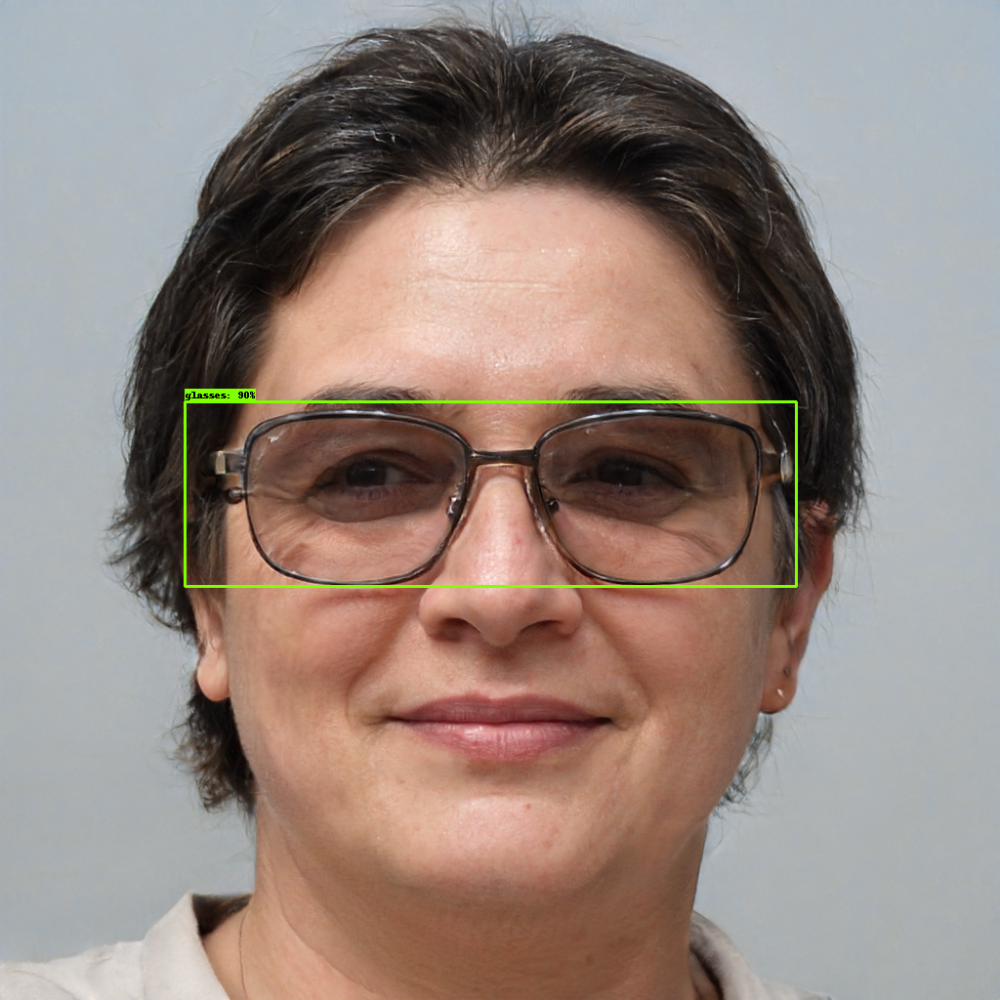

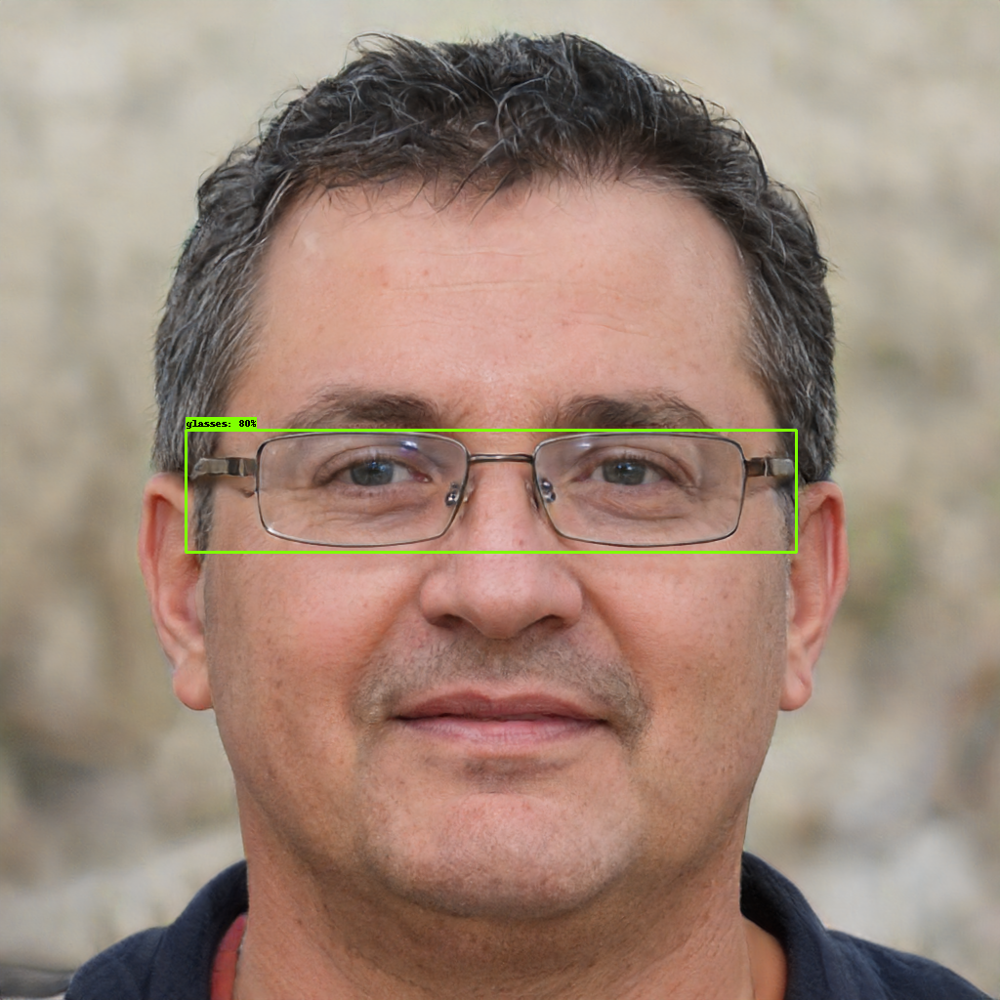

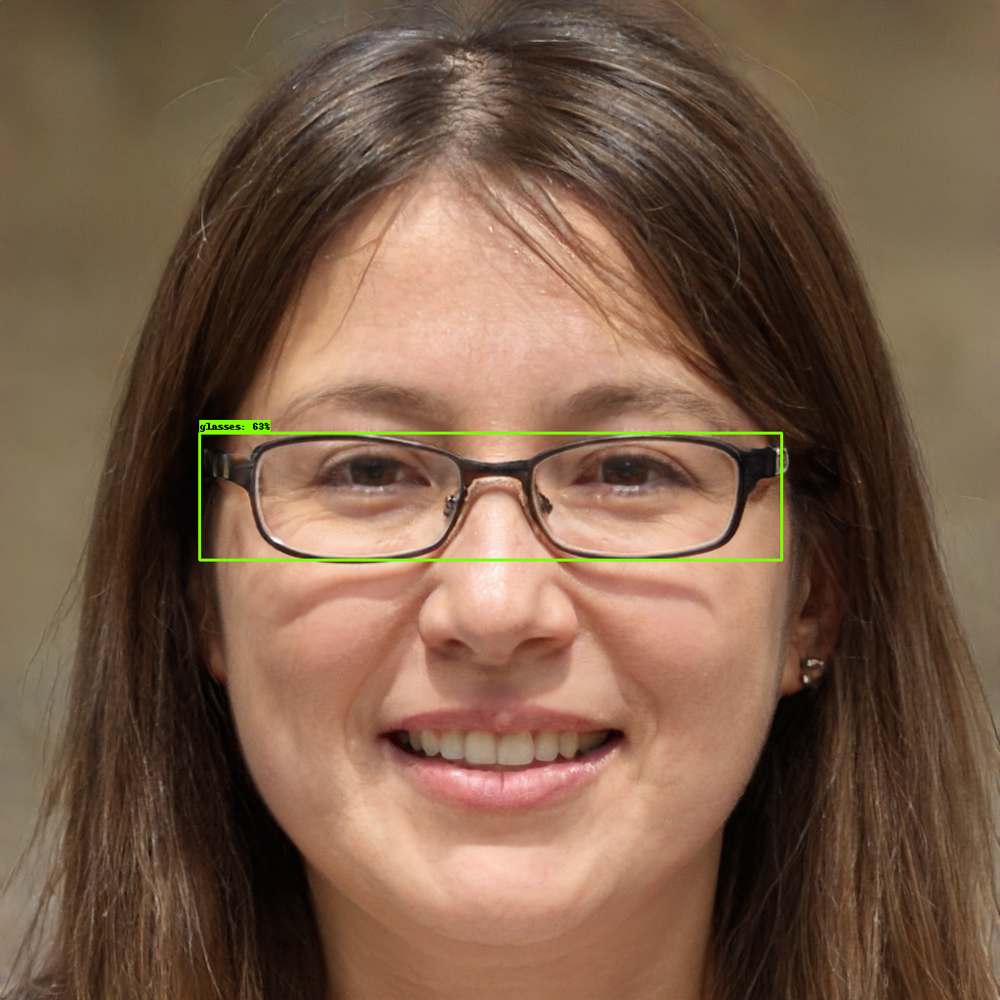

In [28]:
for image_name in images:
  
  image_np = load_image_into_numpy_array(path_root+'/dataset/images/' + image_name)
  output_dict = run_inference_for_single_image(model, image_np)
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      use_normalized_coordinates=True,
      line_thickness=3)
  display(Image.fromarray(image_np))

#### Everything is working well, so we’re ready to put the model in production.

# Deploying the model
The model is going to be deployed in a way that anyone can open a PC or mobile camera and perform inferences in real-time through a web browser. To do that, we’re going to convert the saved model to the Tensorflow.js layers format, load the model in a javascript application and make everything available on Glitch.

#### Converting the model
At this point, you should have something similar to this structure saved locally:
#####├── inference-graph
#####│ ├── saved_model
#####│ │ ├── assets
#####│ │ ├── saved_model.pb
#####│ │ ├── variables
#####│ │ ├── variables.data-00000-of-00001
#####│ │ └── variables.index

#### Before we start, let's create an isolated Python environment to work in an empty workspace and avoid any library conflict. Install virtualenv and then open a terminal in the inference-graph folder and create and activate a new virtual environment:
``` 
virtualenv -p python3 venv
source venv/bin/activate 
```

#### Install the TensorFlow.js converter:

```
pip install tensorflowjs[wizard]

```

#### Start the conversion wizard:

```
tensorflowjs_wizard

```
Now, the tool will guide you through the conversion, providing explanations for each choice you need to make. The image below shows all the choices that were made to convert the model. Most of them are the standard ones, but options like the shard sizes and compression can be changed according to your needs.

To enable the browser to cache the weights automatically, it’s recommended to split them into shard files of around 4MB. To guarantee that the conversion is going to work, don’t skip the op validation as well, not all TensorFlow operations are supported so some models can be incompatible with TensorFlow.js — See this list for which ops are currently supported.

## Installing tensorflowjs

In [ ]:
!pip3 install tensorflowjs

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


## Converting and saving tf saved model into tfjs web model

In [ ]:
!tensorflowjs_converter \
     --input_format=tf_saved_model  \
     {path_root}/inference_graph/saved_model \
     {path_root}/inference_graph/web_model

2022-06-08 08:15:02.452021: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
Writing weight file /content/drive/MyDrive/DSs/FabrikObjectDetection/inference_graph/saved_model_tfjs/model.json...


If everything worked well, you’re going to have the model converted to the Tensorflow.js layers format in the web_modeldirectory. The folder contains a model.json file and a set of sharded weights files in a binary format. The model.json has both the model topology (aka "architecture" or "graph": a description of the layers and how they are connected) and a manifest of the weight files (Lin, Tsung-Yi, et al).


```
└ web_model
  ├── group1-shard1of5.bin
  ├── group1-shard2of5.bin
  ├── group1-shard3of5.bin
  ├── group1-shard4of5.bin
  ├── group1-shard5of5.bin
  └── model.json
```



## Compressing tfjs/web model to download - Run once if you are using Google drive else once per session.

In [ ]:
!zip -r {path_root}/inference_graph/web_model.zip {path_root}/inference_graph/web_model

  adding: content/drive/MyDrive/DSs/FabrikObjectDetection/inference_graph/web_model/ (stored 0%)
  adding: content/drive/MyDrive/DSs/FabrikObjectDetection/inference_graph/web_model/group1-shard1of5.bin (deflated 7%)
  adding: content/drive/MyDrive/DSs/FabrikObjectDetection/inference_graph/web_model/group1-shard2of5.bin (deflated 7%)
  adding: content/drive/MyDrive/DSs/FabrikObjectDetection/inference_graph/web_model/group1-shard3of5.bin (deflated 7%)
  adding: content/drive/MyDrive/DSs/FabrikObjectDetection/inference_graph/web_model/group1-shard4of5.bin (deflated 6%)
  adding: content/drive/MyDrive/DSs/FabrikObjectDetection/inference_graph/web_model/group1-shard5of5.bin (deflated 7%)
  adding: content/drive/MyDrive/DSs/FabrikObjectDetection/inference_graph/web_model/model.json (deflated 96%)


### Downloading Shards i.e. Converted web tfjs model

In [ ]:
from google.colab import files
files.download(path_root+"/inference_graph/web_model.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Extracting folder structure from given github link

In [ ]:
!unzip {path_root}"/TFJS-object-detection-master" -d {path_root}"/"

Archive:  /content/drive/MyDrive/DSs/FabrikObjectDetection/TFJS-object-detection-master.zip
   creating: /content/drive/MyDrive/DSs/FabrikObjectDetection/TFJS-object-detection-master/TFJS-object-detection-master/
  inflating: /content/drive/MyDrive/DSs/FabrikObjectDetection/TFJS-object-detection-master/TFJS-object-detection-master/.gitignore  
   creating: /content/drive/MyDrive/DSs/FabrikObjectDetection/TFJS-object-detection-master/TFJS-object-detection-master/git_media/
  inflating: /content/drive/MyDrive/DSs/FabrikObjectDetection/TFJS-object-detection-master/TFJS-object-detection-master/LICENSE  
   creating: /content/drive/MyDrive/DSs/FabrikObjectDetection/TFJS-object-detection-master/TFJS-object-detection-master/models/
   creating: /content/drive/MyDrive/DSs/FabrikObjectDetection/TFJS-object-detection-master/TFJS-object-detection-master/models/web_model/
  inflating: /content/drive/MyDrive/DSs/FabrikObjectDetection/TFJS-object-detection-master/TFJS-object-detection-master/models/

# Configuring the application
The model is ready to be loaded in javascript. I’ve created an application to perform inferences directly from the browser. Let’s clone the [repository](https://github.com/hugozanini/TFJS-object-detection) to figure out how to use the converted model in real-time. This is the project structure:
```
├── models
│   └── <tfjs-model>
│       ├── group1-shard1of5.bin
│       ├── group1-shard2of5.bin
│       ├── group1-shard3of5.bin
│       ├── group1-shard4of5.bin
│       ├── group1-shard5of5.bin
│       └── model.json
├── package.json
├── package-lock.json
├── public
│   └── index.html
├── README.MD
└── src
    ├── index.js
    └── styles.css
```
For the sake of simplicity, I already provide a converted Glasses-detector model in the models folder. However, let’s put the web_model generated in the previous section in the models folder and test it.

The first thing to do is to define how the model is going to be loaded in the function load_model (lines 10–15 in the file src>index.js). There are two choices.

The first option is to create an HTTP server locally that will make the model available in a URL allowing requests and be treated as a REST API. When loading the model, TensorFlow.js will do the following requests:
```
GET /model.json
GET /group1-shard1of5.bin
GET /group1-shard2of5.bin
GET /group1-shard3of5.bin
GET /group1-shardo4f5.bin
GET /group1-shardo5f5.bin
```
If you choose this option, define the load_model function as follows:
```
  async function load_model() {
    // It's possible to load the model locally or from a repo
    // You can choose whatever IP and PORT you want in the "http://127.0.0.1:8080/model.json"     just set it before in your https server
    const model = await loadGraphModel("http://127.0.0.1:8080/model.json");
    //const model = await loadGraphModel("https://raw.githubusercontent.com/hugozanini/TFJS-object-detection/master/models/web_model/model.json");
    return model;
}
```
Then install the http-server:
```
npm install http-server -g
```
Go to models > web_model and run the command below to make the model available at http://127.0.0.1:8080 . This a good choice when you want to keep the model weights in a safe place and control who can request inferences to it. The -c1 parameter is added to disable caching, and the --cors flag enables cross origin resource sharing allowing the hosted files to be used by the client side JavaScript for a given domain.
```
http-server -c1 --cors .
```
Alternatively you can upload the model files somewhere, in my case, I chose my own Github repo and referenced to the model.json URL in the load_model function:
```
async function load_model() {
    // It's possible to load the model locally or from a repo
    //const model = await loadGraphModel("http://127.0.0.1:8080/model.json");
    const model = await loadGraphModel("https://raw.githubusercontent.com/hugozanini/TFJS-object-detection/master/models/web_model/model.json");
    return model;
}
```
This is a good option because it gives more flexibility to the application and makes it easier to run on some platform as Glitch.
## Running locally
### To run the app locally, install the required packages:
```
npm install
And start:
npm start
```
The application is going to run at http://localhost:3000 and you should see something similar to this:
enter your screenshot image
The model takes from 1 to 2 seconds to load and, after that, you can show Glasses images to the camera and the application is going to draw bounding boxes around them.
## Publishing in Glitch
Glitch is a simple tool for creating web apps where we can upload the code and make the application available for everyone on the web. Uploading the model files in a GitHub repo and referencing to them in the load_model function, we can simply log into Glitch, click on New project > Import from Github and select the app repository.

Wait some minutes to install the packages and your app will be available in a public URL. Click on Show > In a new window and a tab will be open. Copy this URL and past it in any web browser (PC or Mobile) and your object detection will be ready to run. See some examples in the video below:
```
https://www.youtube.com/watch?v=SaGz8KX-TEE
```
First, I did a test showing a Glasses sign to verify the robustness of the application. It showed that the model is focusing specifically on the Glasses features and did not specialize in irrelevant characteristics that were present in many images, such as pale colors or shrubs.

Then, I opened the app on my mobile and showed some images from the test set. The model runs smoothly and identifies most of the Glasses. If you want to test my live app, it is available here (glitch takes some minutes to wake up).

Besides the accuracy, an interesting part of these experiments is the inference time — everything runs in real-time in the browser via JavaScript. Good object detection models running in the browser and using few computational resources is a must in many applications, mostly in industry. Putting the Machine Learning model on the client-side means cost reduction and safer applications as user privacy is preserved as there is no need to send the information to any server to perform the inference.
## Next steps:
Object detection in the browser can solve a lot of real-world problems and I hope this article will serve as a basis for new projects involving Computer Vision, Python, TensorFlow and Javascript.

As the next steps, I’d like to make more detailed training experiments. Due to the lack of resources, I could not try many different parameters and I’m sure that there is a lot of room for improvements in the model.

I’m more focused on the models' training, but I’d like to see a better user interface for the app. If someone is interested in contributing to the project, feel free to create a pull request in the project repo. It will be nice to make a more user-friendly application.

If you have any questions or suggestions you can reach me out on Linkedin ```https://www.linkedin.com/in/mowaqardongre/?locale=en_US```. Thanks for reading!
```
https://www.youtube.com/watch?v=SaGz8KX-TEE
```

# Reference:
https://blog.tensorflow.org/2021/01/custom-object-detection-in-browser.html
Customized as per our need.